# Data analysis for Cells

Import the relevant packages.

In [1]:
using DataFrames, CSV, Plots, LaTeXStrings

Choose plots theme and color scheme.

In [2]:
Plots.theme(:dao)

In [3]:
pal = cgrad(:tol_muted);
cpal10 = [pal[i] for i in 0.0:1/46:1]

Need to import the data.

In [4]:
raw_data = DataFrame(CSV.File("./data/normalized_proteomes.csv"));
first(raw_data,5)
Snames = names(raw_data);

In [5]:
Snames;

Sort alphabetically.

In [6]:
raw_data_alph = raw_data[!,sortperm(Snames)]
Snames = names(raw_data_alph);

In [7]:
Snames[1:20];

## Collect repeated strains.

For strains that are repeated, we won't consider them individually, but as an average.

In [9]:
group0 = Snames[3:4]; ind0 = collect(3:4);
group1 = Snames[17:19]; ind1 = collect(17:19);
group2 = Snames[20:21]; ind2 = collect(20:21);
group3 = Snames[23:24]; ind3 = collect(23:24);
group4 = Snames[30:35]; ind4 = collect(30:35);
group5 = Snames[36:37]; ind5 = collect(36:37);
group6 = Snames[39:41]; ind6 = collect(39:41);
group7 = Snames[53:56]; ind7 = collect(53:56);
group8 = Snames[57:59]; ind8 = collect(57:59);
group9 = Snames[14:15]; ind9 = collect(14:15)
rm_inds = sort(vcat(ind0,ind1,ind2,ind3,ind4,ind5,ind6,ind7,ind8,ind9));

Create function that removes the `NA` values from each species' array.

In [10]:
function remove_NAs(arr)
    new_arr = ones(0)
    # if already a vector of float64 simply return
    if typeof(arr) == Vector{Float64}
        return arr
    # otherwise, needs parsing
    else
        for e in arr
            if e != "NA"
                push!(new_arr,parse(Float64,e))
            end
        end
    end
    return new_arr
end

remove_NAs (generic function with 1 method)

Apply to all the species.

In [11]:
all_data = [];
[push!(all_data, remove_NAs(raw_data_alph[:,i])) for i in 1:length(raw_data_alph[1,:])];
all_data;

Now let's deal with the data that has the repeated strains.

In [13]:
function pad_arrays(arrays::Vector)
    # find longest vector
    longest = 0
    l_ind = 0
    for (i,vec) in enumerate(arrays)
        if length(vec)>longest
            longest = length(vec)
            l_ind = i
        end
    end
    new_arrays = copy(arrays)
    # pad the other arrays
    for i in 1:length(arrays)
        if i == l_ind
            new_arrays[i] = arrays[i]
        else
            new_arrays[i] = vcat(arrays[i],zeros(longest-length(arrays[i])))
        end
    end
    return new_arrays
end

pad_arrays (generic function with 1 method)

In [14]:
padded_arrs0 = pad_arrays(all_data[ind0])
padded_arrs1 = pad_arrays(all_data[ind1])
padded_arrs2 = pad_arrays(all_data[ind2])
padded_arrs3 = pad_arrays(all_data[ind3])
padded_arrs4 = pad_arrays(all_data[ind4])
padded_arrs5 = pad_arrays(all_data[ind5])
padded_arrs6 = pad_arrays(all_data[ind6])
padded_arrs7 = pad_arrays(all_data[ind7])
padded_arrs8 = pad_arrays(all_data[ind8]);
padded_arrs9 = pad_arrays(all_data[ind9]);

We take the mean of the rank-frequency distributions from each repeated strain (although the diversity curve exponents are roughly independent of this choice).

In [16]:
avg0 = sum(padded_arrs0)./length(padded_arrs0)
avg1 = sum(padded_arrs1)./length(padded_arrs1)
avg2 = sum(padded_arrs2)./length(padded_arrs2)
avg3 = sum(padded_arrs3)./length(padded_arrs3)
avg4 = sum(padded_arrs4)./length(padded_arrs4)
avg5 = sum(padded_arrs5)./length(padded_arrs5)
avg6 = sum(padded_arrs6)./length(padded_arrs6)
avg7 = sum(padded_arrs7)./length(padded_arrs7)
avg8 = sum(padded_arrs8)./length(padded_arrs8)
avg9 = sum(padded_arrs9)./length(padded_arrs9);

Now let's round each number in each array, sort, normalize, and then discard any zeros.

In [17]:
non_rep_ind = deleteat!(collect(1:length(all_data)),rm_inds);

In [18]:
length(non_rep_ind)

37

In [19]:
new_data = [all_data[i] for i in non_rep_ind]
push!(new_data, avg0)
push!(new_data, avg1)
push!(new_data, avg2)
push!(new_data, avg3)
push!(new_data, avg4);
push!(new_data, avg5);
push!(new_data, avg6);
push!(new_data, avg7);
push!(new_data, avg8);
push!(new_data, avg9);


new_names = vcat([Snames[j] for j in non_rep_ind], Snames[[3,14,17,20,23,30,36,39,53,57]]);
new_names2 = [];
for (i,nm) in enumerate(new_names)
    newstr = [];
    for (j,e) in enumerate(nm)
        if e==' '
            push!(newstr,"_")
        else
            push!(newstr,e)
        end
    end
    push!(new_names2,string(newstr...))
end
new_names = new_names2;

In [20]:
round_data = [sort(round.(Int,new_data[i]), rev = true) for i in 1:length(new_data)];
[deleteat!(round_data[i], findall(x->x==0.0,round_data[i])) for i in 1:length(new_data)];
round_data_norm = [round_data[i]./sum(round_data[i]) for i in 1:length(new_data)];

Plot the rank frequency distributions of the proteins for each bacterial cell. 

In [22]:
scatter(round_data_norm[1], xaxis = :log, yaxis = :log, grid = false, minorgrid = false, legend = :bottomleft, 
    size = (400,400), color = cpal10[1], label = Snames[1], alpha = 0.2)
for i in 2:length(new_data)
    scatter!(round_data_norm[i], color = cpal10[i], label = Snames[i], alpha = 0.1)
end
plot!(legend = :none, ylabel = "Norm. rank-freq.", xlabel = "Rank", title = "Scaling of diversity: proteins")
# savefig("./structure-cells.pdf")

Let's also take the diversity as a function of the system size.

In [23]:
diversities = [length(round_data[i]) for i in 1:length(new_data)]
system_sizes = [sum(round_data[i]) for i in 1:length(new_data)];

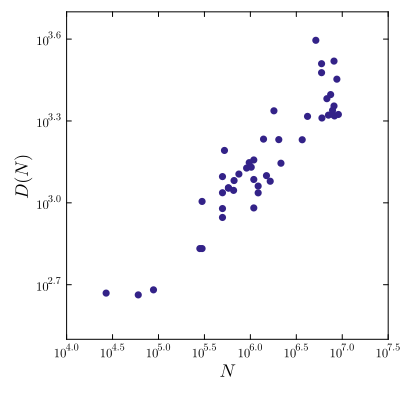

In [24]:
scatter(system_sizes,diversities, xaxis = :log, yaxis = :log, grid = false, minorgrid = false, 
    size = (400,400), color = cpal10[1], legend = :none,ylabel = L"D(N)", xlabel = L"N",
    xlims = [10^4, 10^7.5], ylims = [10^2.5, 10^3.7])

# Save the formatted data

Need to save `new_names` and `new_data` to file.

In [25]:
concat_data = [vcat(new_names[i],round_data[i]) for i in 1:length(new_names)];

In [26]:
using DelimitedFiles

In [27]:
writedlm("./data/cell_rf_data.csv",concat_data)

Also split data into three packets.

In [28]:
packet_sizes = [20,20,7];

In [29]:
length(concat_data[41:end])

7

In [30]:
writedlm("./data/cell_rf_data_1.csv", concat_data[1:20])
writedlm("./data/cell_rf_data_2.csv", concat_data[21:40])
writedlm("./data/cell_rf_data_3.csv", concat_data[41:end])

In [31]:
read_data = readdlm("./data/cell_rf_data.csv");

In [32]:
import_names = read_data[:,1]
import_data = [deleteat!(read_data[i,:],1) for i in 1:length(read_data[:,1])]
[filter!(e -> e ≠ "",import_data[i]) for i in 1:length(read_data[:,1])]
import_data;

In [33]:
workers_import = sum.(import_data);

In [34]:
sort(workers_import);

In [35]:
sortperm(workers_import);